In [1]:
import os
from os import walk
import pyproj
import numpy as np
import pandas as pd
import plotly.express as px
import math
import matplotlib.pyplot as plt
import matplotlib as mpl

from scipy.spatial import distance
from math import dist
from matplotlib.lines import Line2D
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.dates as mdates

In [2]:
def lla_to_ecef(lat, lon, alt): # WGS84 to ECEF
    lat = np.deg2rad(lat)
    lon = np.deg2rad(lon)
    rad = np.float64(6378137.0)
    rad_a = np.float64(6378137.0)        # Radius of the Earth (in meters)
    rad_b = np.float64(6356752.314245)        # semi-minor axis (in meters)
    e_2 = 1-(rad_b**2 / rad_a**2)
    N_phi = rad_a / np.sqrt(1-e_2 * np.sin(lat)**2)
    f = np.float64(1.0/298.257223563)  # Flattening factor WGS84 Model
    np.cosLat = np.cos(lat)
    np.sinLat = np.sin(lat)
    FF     = (1.0-f)**2
    C      = 1/np.sqrt(np.cosLat**2 + FF * np.sinLat**2)
    S      = C * FF

    x = (rad * C + alt)*np.cosLat * np.cos(lon)
    y = (rad * C + alt)*np.cosLat * np.sin(lon)
    z = (rad * S + alt)*np.sinLat
    return x, y, z

In [3]:
# M7.5 2023 Turkey Earthquake
earthquake_lat = 37.203
earthquake_lon = 38.024
earthquake_alt = 0
eq_x, eq_y, eq_z = lla_to_ecef(earthquake_lat, earthquake_lon, earthquake_alt)

h=350000; # elevation of IPP in meters

path_of_the_directory = 'final_results_10min_int'

for filename in os.listdir(path_of_the_directory):
    f = os.path.join(path_of_the_directory,filename)
    if os.path.isfile(f):
        data = pd.read_csv(f)
        data['Time'] = pd.to_datetime(data['Time'])
        data.set_index('Time', inplace=True)
        data['IPP_alt'] = h;
        data['IPP_x'], data['IPP_y'], data['IPP_z'] = lla_to_ecef(data['ipplat'], data['ipplon'], data['IPP_alt'])

        dist_xyz = []
        for i in range(0, len(data)):
            dist_x = (eq_x - data['IPP_x'].iloc[i])**2
            dist_y = (eq_y - data['IPP_y'].iloc[i])**2
            dist_z = (eq_z - data['IPP_z'].iloc[i])**2
            dist_ = np.sqrt(dist_x+dist_y+dist_z)
            dist_xyz.append(dist_)

        data['distance_to_earthquake'] = np.array(dist_xyz) / 1000 # meters to km
        data.to_csv('mapping_results_10min_int/{0}_map.csv'.format(filename[:-4]))

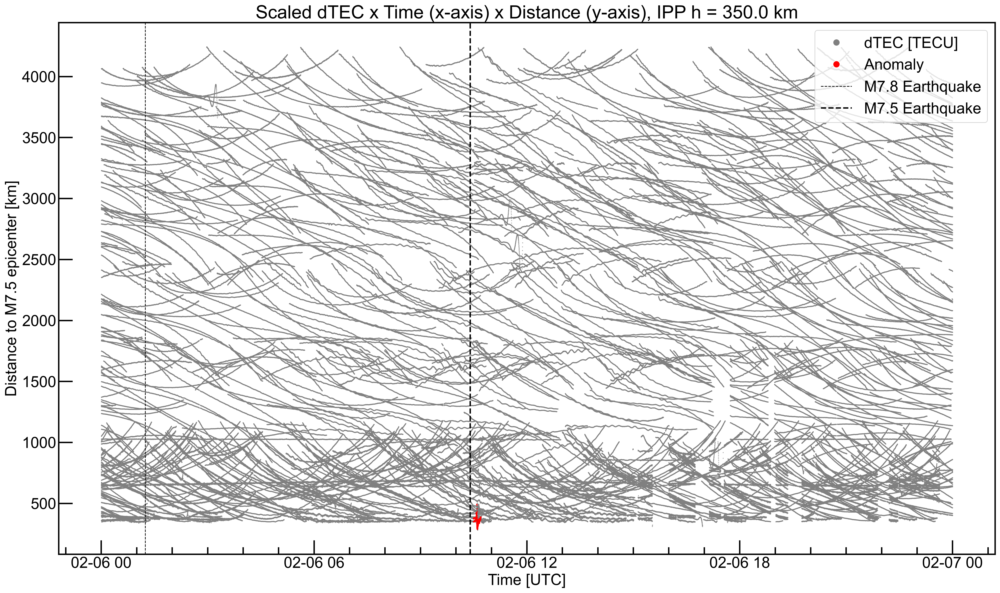

In [4]:
######## DAY OF  PLOT
plt.rcParams["font.family"] = "Arial"
plt.rcParams['font.size'] = 22
plt.rcParams['axes.linewidth'] = 2
h=350000
start = "2023-02-06 00:00:00.00"
end = "2023-02-07 00:00:00.00"
fig, ax = plt.subplots(figsize=(24,14), dpi=300)
legend_elements = [Line2D([0], [0], marker='o', color='w', label='dTEC [TECU]',
                         markerfacecolor='gray', markersize=10),
                   Line2D([0], [0], marker='o', color='w', label='Anomaly',
                          markerfacecolor='red', markersize=10),
                  Line2D([0], [0], color='black', ls='--', lw=1, label='M7.8 Earthquake'),
                  Line2D([0], [0], color='black', ls='--', lw=2, label='M7.5 Earthquake')]
path_of_the_directory = 'mapping_results_10min_int'

for filename in os.listdir(path_of_the_directory):
    f = os.path.join(path_of_the_directory,filename)
    df = pd.read_csv(f)
    df['Time'] = pd.to_datetime(df['Time'])
    df.set_index('Time', inplace=True)
    
    df = df.loc[start:end].copy()
    df = df.reset_index() 
    df['Time'] = pd.to_datetime(df['Time'])
    df.set_index('Time', inplace=True)
    
    df['scaled_dTEC'] = df['distance_to_earthquake']+(df['dTEC']*50)
    if 'anomaly' in df.columns:
        df['scaled_anomaly'] = df['distance_to_earthquake']+(df['anomaly']*50)

    ax.scatter(df.index, df['scaled_dTEC'], s=0.1, color = 'gray')
    if 'anomaly' in df.columns:
        ax.scatter(df.index, df['scaled_anomaly'], s=1, color = 'red')
        
ax.axvline(pd.to_datetime('2023-02-06 01:14:30.00'), ls = '--', lw=1, color = 'black')
ax.axvline(pd.to_datetime('2023-02-06 10:24:00.00'), ls = '--', lw=2, color = 'black')
ax.xaxis.set_tick_params(which='major', size=20, width=2, direction='in', top=False)
ax.xaxis.set_tick_params(which='minor', size=10, width=2, direction='in', top=False)
ax.xaxis.set_major_locator(mdates.HourLocator(byhour=[0,6,12,18]))
ax.xaxis.set_minor_locator(mdates.HourLocator())
ax.yaxis.set_tick_params(which='major', size=20, width=2, direction='in', top=False)
ax.set_xlabel('Time [UTC]')
ax.set_ylabel('Distance to M7.5 epicenter [km]')
ax.legend(handles=legend_elements, loc='upper right')
ax.set_title(f'Scaled dTEC x Time (x-axis) x Distance (y-axis), IPP h = {h/1000} km')
plt.show()

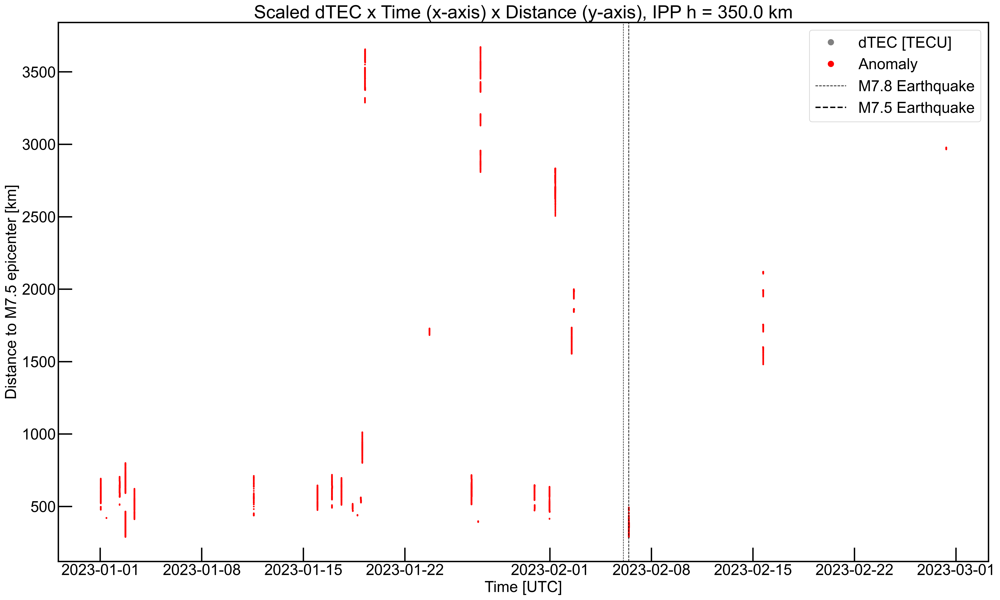

In [50]:
######## Week PLOT

plt.rcParams["font.family"] = "Arial"
plt.rcParams['font.size'] = 22
plt.rcParams['axes.linewidth'] = 2
h=350000
start = "2023-01-01 00:00:00.00"
end = "2023-03-01 00:00:00.00"
fig, ax = plt.subplots(figsize=(24,14), dpi=300)
legend_elements = [Line2D([0], [0], marker='o', color='w', label='dTEC [TECU]',
                         markerfacecolor='gray', markersize=10),
                   Line2D([0], [0], marker='o', color='w', label='Anomaly',
                          markerfacecolor='red', markersize=10),
                  Line2D([0], [0], color='black', ls='--', lw=1, label='M7.8 Earthquake'),
                  Line2D([0], [0], color='black', ls='--', lw=2, label='M7.5 Earthquake')]
path_of_the_directory = 'mapping_results_10min_int'

for filename in os.listdir(path_of_the_directory):
    f = os.path.join(path_of_the_directory,filename)
    df = pd.read_csv(f)
    df['Time'] = pd.to_datetime(df['Time'])
    df.set_index('Time', inplace=True)
    
    df = df.loc[start:end].copy()
    df = df.reset_index() 
    df['Time'] = pd.to_datetime(df['Time'])
    df.set_index('Time', inplace=True)
    
    df['scaled_dTEC'] = df['distance_to_earthquake']+(df['dTEC']*50)
    if 'anomaly' in df.columns:
        df['scaled_anomaly'] = df['distance_to_earthquake']+(df['anomaly']*50)

#     ax.scatter(df.index, df['scaled_dTEC'], s=0.1, color = 'gray')
    if 'anomaly' in df.columns:
        ax.scatter(df.index, df['scaled_anomaly'], s=2, color = 'red')
        df_copy = df[df['scaled_anomaly'].notna()]
#         print(df_copy.index[0], df_copy.index[-1])
        
        
ax.axvline(pd.to_datetime('2023-02-06 01:17:34.00'), ls = '--', lw=0.7, color = 'black')
ax.axvline(pd.to_datetime('2023-02-06 10:24:00.00'), ls = '--', lw=1, color = 'black')
ax.xaxis.set_tick_params(which='major', size=20, width=2, direction='in', top=False)
# ax.xaxis.set_tick_params(which='minor', size=10, width=2, direction='in', top=False)
# ax.xaxis.set_major_locator(mdates.DayLocator())
# ax.xaxis.set_minor_locator(mdates.HourLocator())
ax.yaxis.set_tick_params(which='major', size=20, width=2, direction='in', top=False)
ax.set_xlabel('Time [UTC]')
ax.set_ylabel('Distance to M7.5 epicenter [km]')
ax.legend(handles=legend_elements, loc='upper right')
ax.set_title(f'Scaled dTEC x Time (x-axis) x Distance (y-axis), IPP h = {h/1000} km')
plt.show()

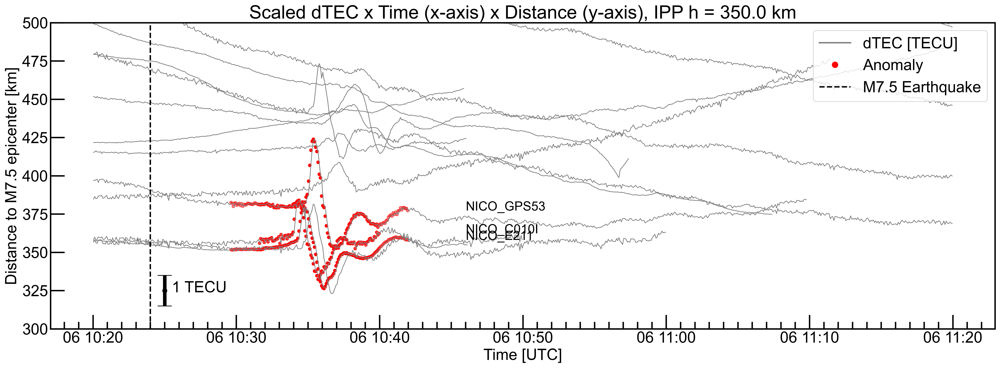

In [5]:
######## DAY OF  PLOT - DETAIL M7.5

plt.rcParams["font.family"] = "Arial"
plt.rcParams['font.size'] = 22
plt.rcParams['axes.linewidth'] = 2
h=350000
start = "2023-02-06 10:20:00.00"
end = "2023-02-06 11:20:00.00"
fig, ax = plt.subplots(figsize=(24,8), dpi=300)
legend_elements = [Line2D([0], [0], color='gray', lw=2, label='dTEC [TECU]'),
                  # Line2D([0], [0], color='black', ls='-', lw=2, label='Forecast'),
                   Line2D([0], [0], marker='o', color='w', label='Anomaly',
                          markerfacecolor='red', markersize=10),
                  Line2D([0], [0], color='black', ls='--', lw=2, label='M7.5 Earthquake')]
path_of_the_directory = 'mapping_results_10min_int'

for filename in os.listdir(path_of_the_directory):
    f = os.path.join(path_of_the_directory,filename)
    df = pd.read_csv(f)
    df['Time'] = pd.to_datetime(df['Time'])
    df.set_index('Time', inplace=True)
    
    df = df.loc[start:end].copy()
    df = df.reset_index() 
    df['Time'] = pd.to_datetime(df['Time'])
    df.set_index('Time', inplace=True)
    
    file_info = filename.split('_')
    station_name = file_info[0]
    sat_name = file_info[1]
    station_sat_name = station_name + '_'+sat_name
    
    df['scaled_dTEC'] = df['distance_to_earthquake']+(df['dTEC']*20)
    if 'anomaly' in df.columns:
       # df['scaled_forecast'] = df['distance_to_earthquake']+(df['forecast']*20)
        df['scaled_anomaly'] = df['distance_to_earthquake']+(df['anomaly']*20)
        temp_value = df['scaled_anomaly'].dropna()

    ax.plot(df.index, df['scaled_dTEC'], lw=1, color = 'gray')
    if ('anomaly' in df.columns):
        if len(df.anomaly)>0:
           # ax.plot(df.index, df['scaled_forecast'], lw=1, ls='-', color = 'black')
            ax.scatter(df.index, df['scaled_anomaly'], s=16, color = 'red', alpha=0.5)
            if len(temp_value)>0:
                ax.text(pd.to_datetime('2023-02-06 10:46:00.00'), temp_value[-1], station_sat_name, fontsize=18)
        
ax.axvline(pd.to_datetime('2023-02-06 10:24:00.00'), ls = '--', lw=2, color = 'black')
ax.errorbar(pd.to_datetime('2023-02-06 10:25:00.00'),325,yerr=10,fmt='o',capsize=10, elinewidth=5,color='k')
ax.text(pd.to_datetime('2023-02-06 10:25:30.00'),324, '1 TECU', fontsize=22)
ax.set_ylim(300, 500)
ax.xaxis.set_tick_params(which='major', size=20, width=2, direction='in', top=False)
ax.xaxis.set_tick_params(which='minor', size=10, width=2, direction='in', top=False)
ax.xaxis.set_major_locator(mdates.MinuteLocator(byminute=[0,10,20,30,40,50]))
ax.xaxis.set_minor_locator(mdates.MinuteLocator())
ax.yaxis.set_tick_params(which='major', size=20, width=2, direction='in', top=False)
ax.set_xlabel('Time [UTC]')
ax.set_ylabel('Distance to M7.5 epicenter [km]')
ax.legend(handles=legend_elements, loc='upper right')
ax.set_title(f'Scaled dTEC x Time (x-axis) x Distance (y-axis), IPP h = {h/1000} km')
plt.show()

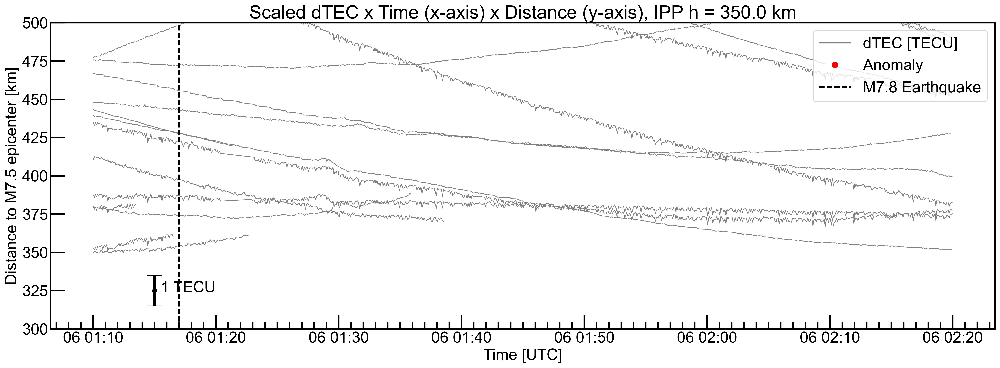

In [6]:
######## DAY OF  PLOT - DETAIL first earthquake

plt.rcParams["font.family"] = "Arial"
plt.rcParams['font.size'] = 22
plt.rcParams['axes.linewidth'] = 2
h=350000
start = "2023-02-06 01:10:00.00"
end = "2023-02-06 02:20:00.00"
fig, ax = plt.subplots(figsize=(24,8), dpi=300)
legend_elements = [Line2D([0], [0], color='gray', lw=2, label='dTEC [TECU]'),
                  # Line2D([0], [0], color='black', ls='-', lw=2, label='Forecast'),
                   Line2D([0], [0], marker='o', color='w', label='Anomaly',
                          markerfacecolor='red', markersize=10),
                  Line2D([0], [0], color='black', ls='--', lw=2, label='M7.8 Earthquake')]
path_of_the_directory = 'mapping_results_10min_int'

for filename in os.listdir(path_of_the_directory):
    f = os.path.join(path_of_the_directory,filename)
    df = pd.read_csv(f)
    df['Time'] = pd.to_datetime(df['Time'])
    df.set_index('Time', inplace=True)
    
    df = df.loc[start:end].copy()
    df = df.reset_index() 
    df['Time'] = pd.to_datetime(df['Time'])
    df.set_index('Time', inplace=True)
    
    file_info = filename.split('_')
    station_name = file_info[0]
    sat_name = file_info[1]
    station_sat_name = station_name + '_'+sat_name
    
    df['scaled_dTEC'] = df['distance_to_earthquake']+(df['dTEC']*20)
    if 'anomaly' in df.columns:
       # df['scaled_forecast'] = df['distance_to_earthquake']+(df['forecast']*20)
        df['scaled_anomaly'] = df['distance_to_earthquake']+(df['anomaly']*20)
        temp_value = df['scaled_anomaly'].dropna()

    ax.plot(df.index, df['scaled_dTEC'], lw=1, color = 'gray')
    if ('anomaly' in df.columns):
        if len(df.anomaly)>0:
           # ax.plot(df.index, df['scaled_forecast'], lw=1, ls='-', color = 'black')
            ax.scatter(df.index, df['scaled_anomaly'], s=16, color = 'red', alpha=0.5)
            if len(temp_value)>0:
                ax.text(pd.to_datetime('2023-02-06 10:46:00.00'), temp_value[-1], station_sat_name, fontsize=18)
        
ax.axvline(pd.to_datetime('2023-02-06 01:17:00.00'), ls = '--', lw=2, color = 'black')
ax.errorbar(pd.to_datetime('2023-02-06 01:15:00.00'),325,yerr=10,fmt='o',capsize=10, elinewidth=5,color='k')
ax.text(pd.to_datetime('2023-02-06 01:15:30.00'),324, '1 TECU', fontsize=22)
ax.set_ylim(300, 500)
ax.xaxis.set_tick_params(which='major', size=20, width=2, direction='in', top=False)
ax.xaxis.set_tick_params(which='minor', size=10, width=2, direction='in', top=False)
ax.xaxis.set_major_locator(mdates.MinuteLocator(byminute=[0,10,20,30,40,50]))
ax.xaxis.set_minor_locator(mdates.MinuteLocator())
ax.yaxis.set_tick_params(which='major', size=20, width=2, direction='in', top=False)
ax.set_xlabel('Time [UTC]')
ax.set_ylabel('Distance to M7.5 epicenter [km]')
ax.legend(handles=legend_elements, loc='upper right')
ax.set_title(f'Scaled dTEC x Time (x-axis) x Distance (y-axis), IPP h = {h/1000} km')
plt.show()

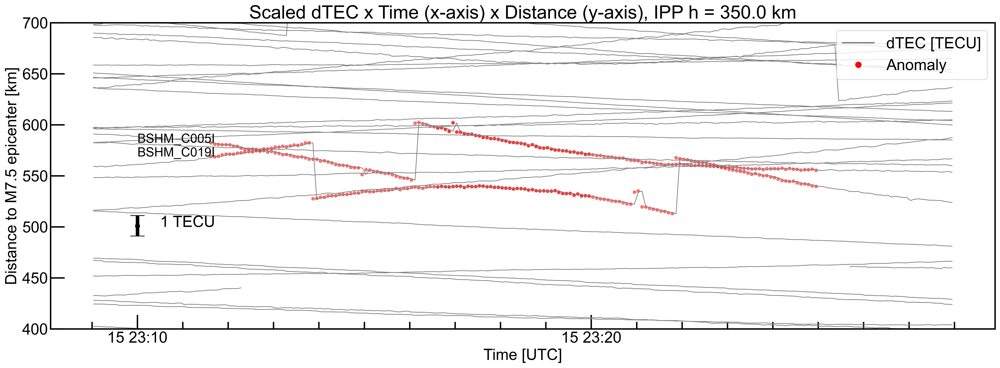

In [10]:
# EXAMPLE OF FALSE POSITIVE DETECTION 
######## 2023-01-15 23:10:02 2023-01-15 23:19:57

plt.rcParams["font.family"] = "Arial"
plt.rcParams['font.size'] = 22
plt.rcParams['axes.linewidth'] = 2
h=350000
start = "2023-01-15 23:09:00"
end = "2023-01-15 23:28:00"
fig, ax = plt.subplots(figsize=(24,8), dpi=300)
legend_elements = [Line2D([0], [0], color='gray', lw=2, label='dTEC [TECU]'),
                   #Line2D([0], [0], color='black', ls='-', lw=2, label='Forecast'),
                   Line2D([0], [0], marker='o', color='w', label='Anomaly',
                          markerfacecolor='red', markersize=10)]
path_of_the_directory = 'mapping_results_10min_int'

for filename in os.listdir(path_of_the_directory):
    f = os.path.join(path_of_the_directory,filename)
    df = pd.read_csv(f)
    df['Time'] = pd.to_datetime(df['Time'])
    df.set_index('Time', inplace=True)
    
    df = df.loc[start:end].copy()
    df = df.reset_index() 
    df['Time'] = pd.to_datetime(df['Time'])
    df.set_index('Time', inplace=True)
    
    file_info = filename.split('_')
    station_name = file_info[0]
    sat_name = file_info[1]
    station_sat_name = station_name + '_'+sat_name
    
    df['scaled_dTEC'] = df['distance_to_earthquake']+(df['dTEC']*20)
    if 'anomaly' in df.columns:
#         df['scaled_forecast'] = df['distance_to_earthquake']+(df['forecast']*20)
        df['scaled_anomaly'] = df['distance_to_earthquake']+(df['anomaly']*20)
        temp_value = df['scaled_anomaly'].dropna()

    ax.plot(df.index, df['scaled_dTEC'], lw=1, color = 'gray')
    if ('anomaly' in df.columns):
        if len(df.anomaly)>0:
#             ax.plot(df.index, df['scaled_forecast'], lw=1, ls='-', color = 'black')
            ax.scatter(df.index, df['scaled_anomaly'], s=16, color = 'red', alpha=0.5)
            if len(temp_value)>0:
                ax.text(pd.to_datetime('2023-01-15 23:10:00'), temp_value[0], station_sat_name, fontsize=18)
        
ax.errorbar(pd.to_datetime('2023-01-15 23:10:00'),501,yerr=10,fmt='o',capsize=10, elinewidth=5,color='k')
ax.text(pd.to_datetime('2023-01-15 23:10:30'),500, '1 TECU', fontsize=22)
ax.set_ylim(400, 700)
ax.xaxis.set_tick_params(which='major', size=20, width=2, direction='in', top=False)
ax.xaxis.set_tick_params(which='minor', size=10, width=2, direction='in', top=False)
ax.xaxis.set_major_locator(mdates.MinuteLocator(byminute=[0,10,20,30,40,50]))
ax.xaxis.set_minor_locator(mdates.MinuteLocator())
ax.yaxis.set_tick_params(which='major', size=20, width=2, direction='in', top=False)
ax.set_xlabel('Time [UTC]')
ax.set_ylabel('Distance to M7.5 epicenter [km]')
ax.legend(handles=legend_elements, loc='upper right')
ax.set_title(f'Scaled dTEC x Time (x-axis) x Distance (y-axis), IPP h = {h/1000} km')
plt.show()

1.0


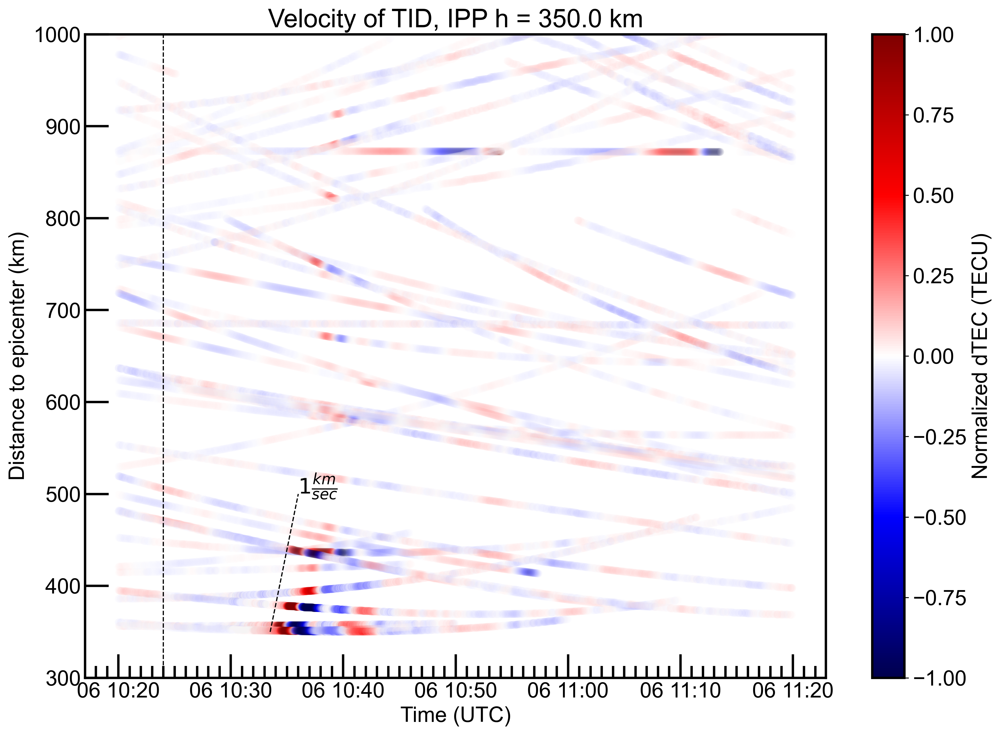

In [17]:
##  plot for velocity approximation
x_line = [pd.to_datetime('2023-02-06 10:33:30.00'),pd.to_datetime('2023-02-06 10:36:00.00')]
y_line = [350,500]

run = (x_line[1]-x_line[0]).total_seconds()
rise = y_line[1]-y_line[0]
print(rise/run)

plt.rcParams["font.family"] = "Arial"
plt.rcParams['font.size'] = 18
plt.rcParams['axes.linewidth'] = 2
h=350000
start = "2023-02-06 10:20:00.00"
end = "2023-02-06 11:20:00.00"
fig, ax = plt.subplots(figsize=(14,10), dpi=300)
norm = mpl.colors.Normalize(vmin=-1,vmax=1)
cmap = 'seismic'
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
path_of_the_directory = '2023_Turkey/mapping_results_10min_int'
for filename in os.listdir(path_of_the_directory):
    f = os.path.join(path_of_the_directory,filename)
    df = pd.read_csv(f)
    df['Time'] = pd.to_datetime(df['Time'])
    df.set_index('Time', inplace=True)
    
    df = df.loc[start:end].copy()
    df = df.reset_index() 
    df['Time'] = pd.to_datetime(df['Time'])
    df.set_index('Time', inplace=True)

    ax.scatter(df.index, df['distance_to_earthquake'], s=45, c=df.dTEC, cmap=cmap, alpha = 0.1, edgecolors= "None", norm=norm)

ax.plot(x_line, y_line, lw=1, ls='--', color='k')
ax.text(x_line[-1], y_line[-1], r'$1 \frac{km}{sec}$', fontsize=18)
ax.axvline(pd.to_datetime('2023-02-06 10:24:00.00'), linestyle = '--', linewidth=1, color = 'black')
ax.set_ylim(300, 1000)
fig.colorbar(sm, label="Normalized dTEC (TECU)", orientation="vertical")
ax.yaxis.set_tick_params(which='major', size=20, width=2, direction='in', top=False)
ax.xaxis.set_tick_params(which='major', size=20, width=2, direction='in', top=False)
ax.xaxis.set_tick_params(which='minor', size=10, width=2, direction='in', top=False)
ax.xaxis.set_major_locator(mdates.MinuteLocator(byminute=[0,10,20,30,40,50]))
ax.xaxis.set_minor_locator(mdates.MinuteLocator())
ax.set_xlabel('Time (UTC)')
ax.set_ylabel('Distance to epicenter (km)')
ax.set_title(f'Velocity of TID, IPP h = {h/1000} km')
plt.show()

min dTEC:  -0.358265482
max dTEC:  0.552661157


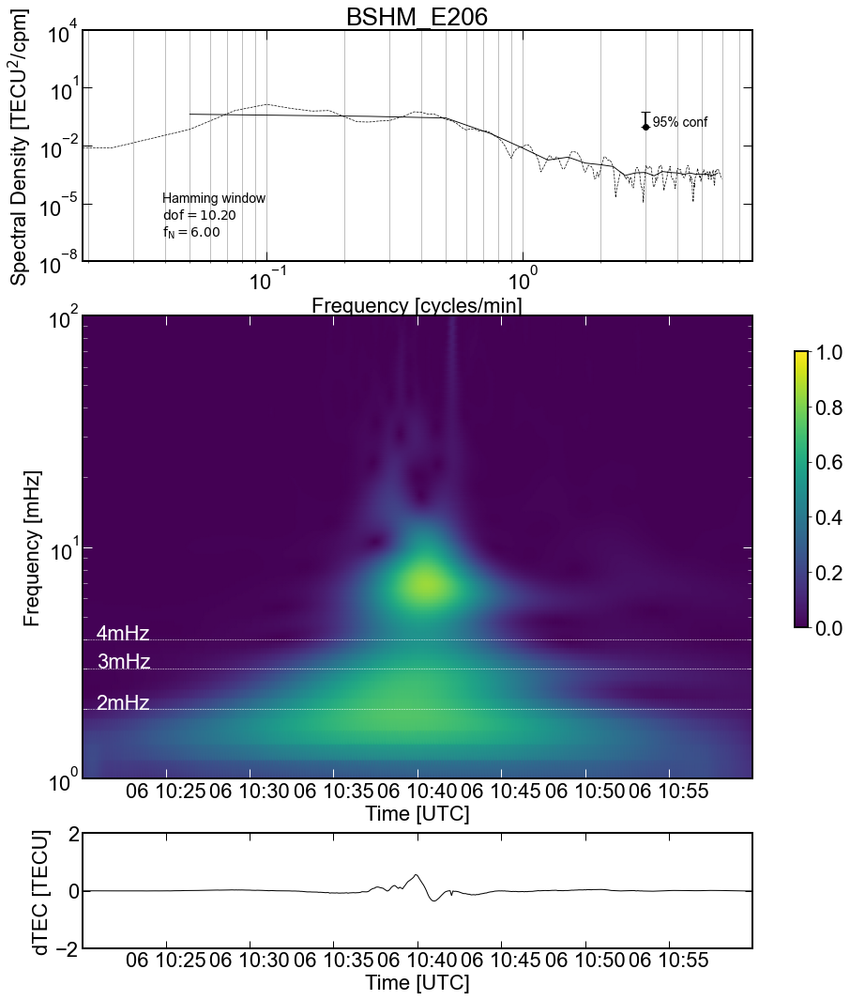

min dTEC:  -1.236449782
max dTEC:  1.357656338


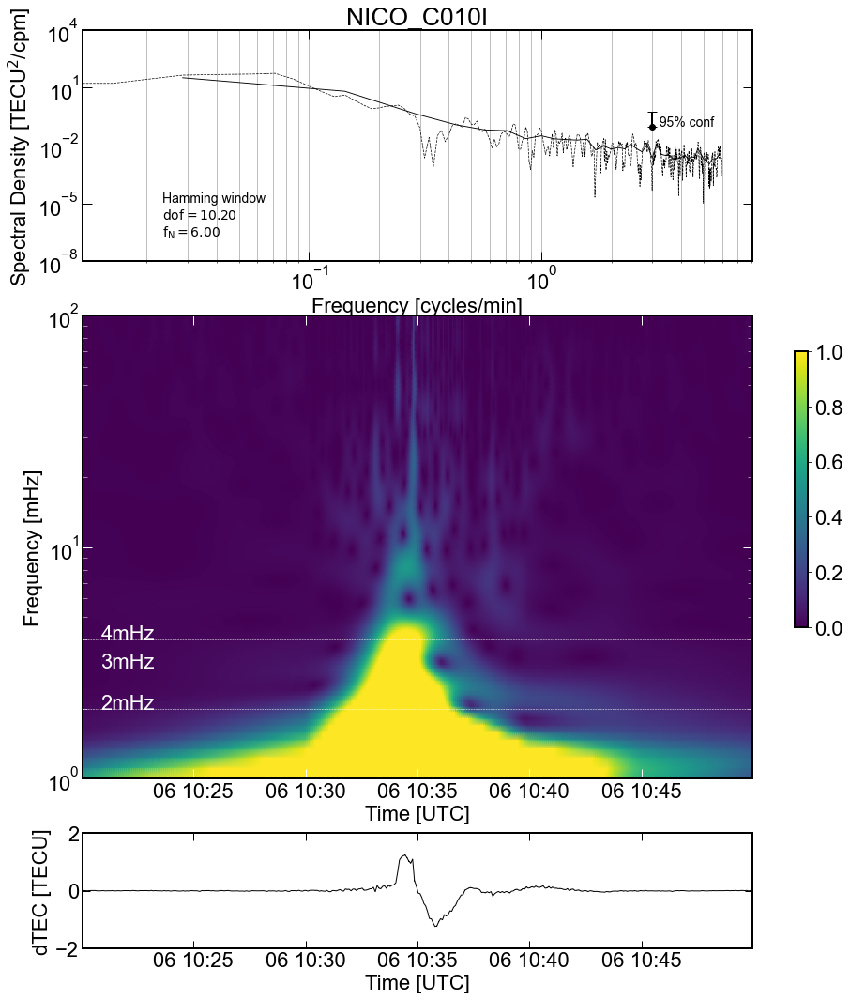

min dTEC:  -1.24052026
max dTEC:  1.389680648


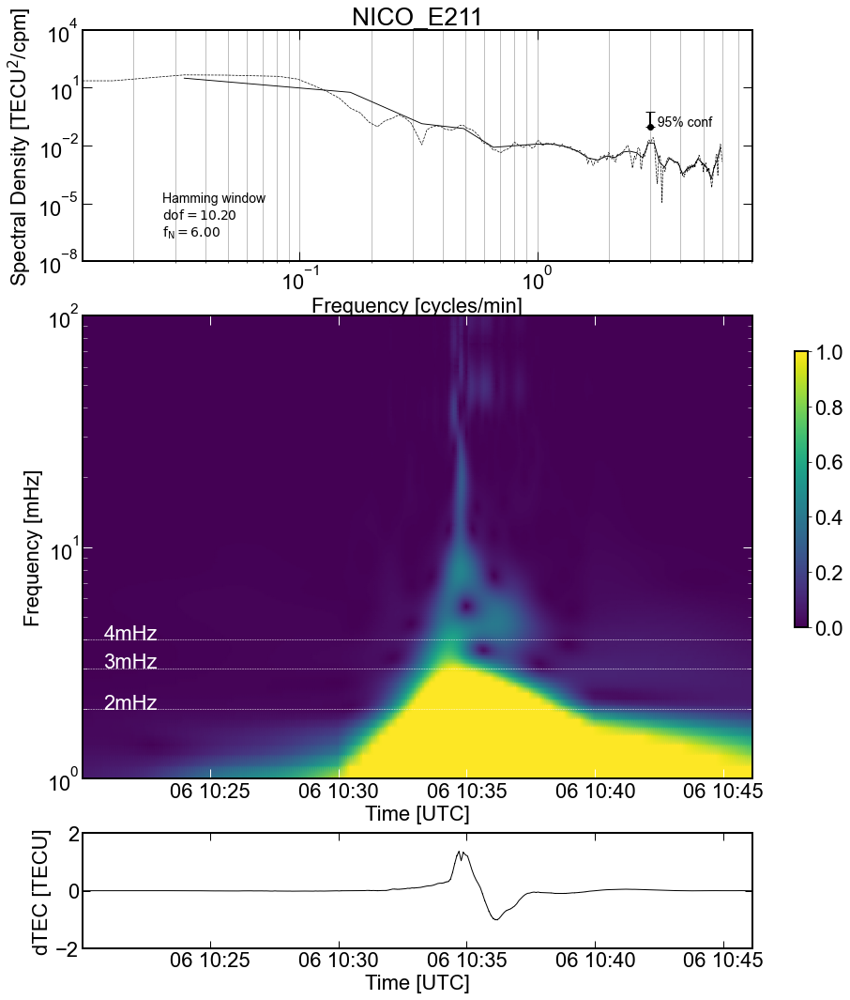

min dTEC:  -1.191104002
max dTEC:  2.295462973


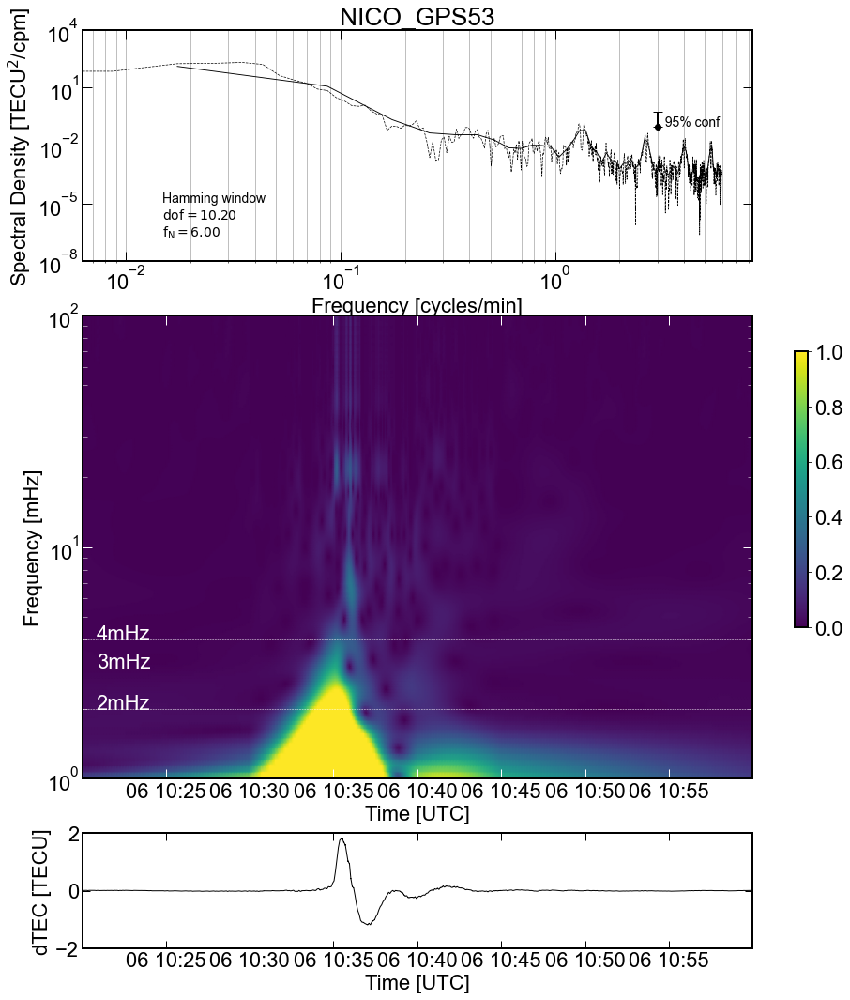

In [40]:
##### WAVELET ANALYSIS
import pandas as pd
import numpy as np
from scipy.io import loadmat
from scipy import signal
import matplotlib.pyplot as plt
import datetime
import math
import os
import scipy.stats
import statistics
import obspy
from obspy.imaging.cm import obspy_sequential
from obspy.signal.tf_misfit import cwt
import pywt

def oneside_PSD(data, delta_t, corr_fac):
    N = len(data)
    fft = np.fft.fft(data, n=N, norm=None)
    freq = np.fft.fftfreq(data.shape[-1])
    delta_f = freq[1]
    freq = np.fft.fftfreq(data.size, d=delta_t)
    PSD = np.divide(np.multiply(np.conj(fft), fft), len(freq))
    PSD = PSD.real*corr_fac
    
    select_indices = np.where(freq >= 0)[0]
    onside_freq = freq[select_indices]
    oneside_PSD = PSD[select_indices]
    for i in range(0,len(oneside_PSD)):
        if i == 0:
            oneside_PSD[i] = oneside_PSD[i]
        if (i > 0) & (i < len(oneside_PSD)):
            oneside_PSD[i] = oneside_PSD[i]*2
        if i == len(oneside_PSD):
            oneside_PSD[i] = oneside_PSD[i]
    return onside_freq, oneside_PSD, delta_f

def band_avg(f_in,p_in,nbins): # nbins must be odd
    nlen = len(f_in)
    center_inds = np.arange(0, nlen, nbins) # if nbins=5, 0,5,10,15,...
    f = f_in[center_inds]
    p = np.zeros(len(f))
    p[0]= (p_in[0:int((nbins+1)/2)]).mean() # if nbins=5 this =0:3 [0,1,2]
    f[0]= (f_in[0:int((nbins+1)/2)]).mean()
    for i in range (1,(len(f)-1)):
        start = center_inds[i]+(-int((nbins-1)/2)) # if nbins=5, the i=1, =5+(-4/2) = 3
        end = center_inds[i]+(int((nbins-1)/2))+1 # if nbins=5, the i=1, =5+(4/2)+1 = 8
        p[i] = (p_in[start:end]).mean() # for i=1, 3:8 [3,4,5,6,7]
    p[len(f)-1] = (p_in[center_inds[len(f)-1]:len(p_in)]).mean() 
    return f, p

start = "2023-02-06 10:20:00.00"
end = "2023-02-06 11:00:00.00"
path_of_the_directory = '2023_Turkey/for_wavelet'
for filename in os.listdir(path_of_the_directory):
    f = os.path.join(path_of_the_directory,filename)
    if os.path.isfile(f):

        df = pd.read_csv(f)
        df['Time'] = pd.to_datetime(df['Time'])
        df.set_index('Time', inplace=True)
        
        df = df.loc[start:end].copy()
        df = df.reset_index() 
        df['Time'] = pd.to_datetime(df['Time'])
        df.set_index('Time', inplace=True)
        file_info = filename.split('_')
        station_name = file_info[0]
        sat_name = file_info[1]
        station_sat_name = station_name + '_'+sat_name

        print('min dTEC: ', min(df.dTEC))
        print('max dTEC: ', max(df.dTEC))
        data_raw = df['dTEC']
        window = np.hamming(len(data_raw))
        corr_fac = 1/statistics.mean(window**2)
        data = data_raw*window

        npts = len(data)
        sample_rate = df.index[1] - df.index[0]
        sample_rate = int(sample_rate.total_seconds())
        dt = sample_rate
        fN = 1/(2*sample_rate)

        # for PSD
        freq, psd, _ = oneside_PSD(data,dt,corr_fac)
        dof = 20
        r_window = 1.96
        band_freq, band_psd = band_avg(freq, psd, int(dof/2))
        Sj = 10e-2
        fN = 1/(2*dt)
        up = dof * Sj / scipy.stats.chi2.ppf(1-0.05/2,dof/r_window)
        low = dof * Sj / scipy.stats.chi2.ppf(0.05/2, dof/r_window)        
        # for scipy cwt
        fs = 1/dt
        w = 6
        freq_cwt = np.linspace(1/1000, fs/2, npts)
        widths = w*fs / (2*freq_cwt*np.pi)
        cwtm = signal.cwt(data, signal.morlet2, widths, w=w)

        fig, ax = plt.subplots(figsize=(16,18), nrows=3, ncols=1, sharex=False, constrained_layout=False, gridspec_kw={'height_ratios': [6, 12, 3]})
        
        ax[2].plot(df.index, data, label = 'dTEC [TECU]', color = 'black', lw=1)
        ax[0].loglog(freq*60, psd, color='black', lw=0.7, ls='--')
        ax[0].loglog(band_freq*60, band_psd, color='black', lw=0.9)
        ax[0].errorbar(0.5*fN*60,Sj,yerr=[[Sj-up],[low-Sj]],fmt='o',capsize=5, elinewidth=2,color='k')
        ax[0].text(0.5*fN*60, Sj, r'  95% conf', fontsize=14)
        im=ax[1].pcolormesh(df.index, freq_cwt*1000, np.abs(cwtm), cmap='viridis', shading='gouraud', vmin=0, vmax=1)
        fig.colorbar(im, ax=[ax[0], ax[1], ax[2]], shrink=0.3)   

        #wave hz lines on wavelet plot
        ax[1].axhline(y=2, linestyle = '--',color = 'w',linewidth=0.5)
        ax[1].axhline(y=3, linestyle = '--',color = 'w',linewidth=0.5)
        ax[1].axhline(y=4, linestyle = '--',color = 'w',linewidth=0.5)
        ax[1].text(df.index[10], 2, r'2mHz', color = 'w')
        ax[1].text(df.index[10], 3, r'3mHz', color = 'w')
        ax[1].text(df.index[10], 4, r'4mHz', color = 'w')

        # psd text
        
        textstr = '\n'.join(('Hamming window', r'$\mathrm{dof}=%.2f$' % (dof/r_window, ), 
                            r'$\mathrm{f_N}=%.2f$' % (fN*60, )))
        ax[0].text(0.02*fN*60, 0.3, textstr, transform=ax[0].transAxes, fontsize=14,
        verticalalignment='top')
        ax[0].xaxis.set_tick_params(which='major', size=10, width=1, direction='in', top=True)
        ax[0].yaxis.set_tick_params(which='major', size=10, width=1, direction='in', top=True)
        ax[0].yaxis.set_tick_params(which='minor', size=5, width=0.5, direction='in', top=True)
        ax[0].set_xlabel("Frequency [cycles/min]")
        ax[0].set_ylabel('Spectral Density [TECU$^2$/cpm]')
        ax[0].set_ylim(10e-9,10e3)
        ax[0].minorticks_on()
        ax[0].xaxis.grid(True, which='major')
        ax[0].xaxis.grid(True, which='minor')

        ax[1].set_xlabel("Time [UTC]")
        ax[1].set_ylabel("Frequency [mHz]")
        ax[1].set_yscale('log')
        ax[1].set_ylim(1, fN*1000)
        ax[1].xaxis.set_tick_params(which='major', size=10, width=1, color='w', direction='in', top=True)
        ax[1].yaxis.set_tick_params(which='major', size=10, width=1, color='w',direction='in', top=True)
        ax[1].yaxis.set_tick_params(which='minor', size=5, width=0.5, color='w',direction='in', top=True)

        ax[2].xaxis.set_tick_params(which='major', size=8, width=1, direction='in', top=True)
        ax[2].yaxis.set_tick_params(which='major', size=8, width=1, direction='in', top=True)
        ax[2].set_ylim(-2, 2)
        ax[2].set_xlim(df.index[0], df.index[-1])
        ax[2].set_xlabel('Time [UTC]')
        ax[2].set_ylabel("dTEC [TECU]")
        ax[0].set_title('{0}'.format(station_sat_name))

        plt.show()

In [9]:
# List of anomaly times
path_of_the_directory = 'sync_results_10min_int'

for filename in os.listdir(path_of_the_directory):
    f = os.path.join(path_of_the_directory,filename)
    if os.path.isfile(f):
        data = pd.read_csv(f)
        data['Time'] = pd.to_datetime(data['Time'])
        data.set_index('Time', inplace=True)
        clip = data[data.anomaly.notna()].copy()
        print(clip.index[0], clip.index[-1], filename)

2023-01-15 23:11:37 2023-01-15 23:19:57 BSHMC005I16_BSHMC019I12_phase_match.csv
2023-01-15 23:16:37 2023-01-15 23:24:57 BSHMC005I17_BSHMC019I13_phase_match.csv
2023-01-16 23:16:37 2023-01-16 23:24:57 BSHMC005I18_BSHMC009I35_phase_match.csv
2023-01-01 00:36:37 2023-01-01 00:44:57 BSHMC005I2_BSHMC009I4_phase_match.csv
2023-01-30 22:26:37 2023-01-30 22:34:57 BSHMC005I38_BSHMC009I80_phase_match.csv
2023-01-31 23:16:37 2023-01-31 23:24:57 BSHMC005I43_BSHMC009I88_phase_match.csv
2023-01-02 08:01:37 2023-01-02 08:01:57 BSHMC007I3_BSHMC010I6_phase_match.csv
2023-01-02 07:58:37 2023-01-02 08:04:57 BSHMC007I4_BSHMC010I5_phase_match.csv
2023-01-02 08:01:37 2023-01-02 08:06:57 BSHMC007I4_BSHMC010I6_phase_match.csv
2023-01-03 08:18:37 2023-01-03 08:26:57 BSHMC007I7_BSHMC224I1_phase_match.csv
2023-01-17 14:54:37 2023-01-17 15:01:57 BSHMC008I12_BSHMC017I29_phase_match.csv
2023-01-18 17:34:37 2023-01-18 17:34:57 BSHMC008I20_BSHMC204M8_phase_match.csv
2023-01-26 14:09:37 2023-01-26 14:16:57 BSHMC008I37

In [7]:
#1# 1/1/2023&	00:35:02 – 00:44:57&	03:35:02 – 03:44:57\\
#2# 1/1/2023&	09:49:02 – 09:58:57&	12:49:02 – 12:58:57\\ REMOVED
#3# 1/2/2023&	07:52:02 – 08:06:57&	10:52:02 – 11:06:57\\
#4# 1/2/2023&	17:24:02 – 17:42:57&	20:24:02 – 20:42:57\\
#5# 1/3/2023&	08:17:02 – 08:26:57&	11:17:02 – 11:26:57\\
#6# 1/11/2023&	13:51:02 – 14:01:57&	16:51:02 – 17:01:57\\
#7# 1/15/2023&	23:10:02 – 23:24:57&	02:10:02 – 02:24:57 + day\\
#8# 1/16/2023&	23:15:02 – 23:29:57&	02:15:02 – 02:29:57 + day\\
#9# 1/17/2023&	14:52:02 – 15:02:57&	17:52:02 – 18:02:57\\
#10# 1/18/2023&	09:25:02 – 09:44:57&	12:25:02 – 12:44:57\\
#11# 1/18/2023&	17:33:02 – 17:42:57&	20:33:02 – 20:42:57\\ # REMOVED
#12# 1/18/2023&	22:55:02 – 23:19:57&	01:55:02 – 02:19:57 +day\\
#13# 1/19/2023&	01:22:02 – 01:32:57&	04:22:02 – 04:32:57\\
#14# 1/19/2023&	05:50:02 – 06:04:57&	08:50:02 – 09:04:57\\
#15# 1/23/2023&	16:31:02 – 16:40:57&	19:31:02 – 19:40:57\\
#16# 1/26/2023&	14:07:02 – 14:22:57&	17:07:02 – 17:22:57\\
#17# 1/27/2023&	01:05:02 – 01:14:57&	04:05:02 – 04:14:57\\
#18# 1/27/2023&	04:58:02 – 05:11:57&	07:58:02 – 08:11:57\\
#19# 1/30/2023&	22:25:02 – 22:34:57&	01:25:02 – 01:34:57 +day\\
#20# 1/31/2023&	23:10:02 – 23:24:57&	02:25:02 – 02:34:57 +day\\
#21# 2/1/2023&	08:37:02 – 08:49:57&	11:37:02 – 11:49:57\\
#22# 2/2/2023&	11:48:02 – 12:02:57&	14:48:02 – 16:02:57\\
#23# 2/2/2023&	15:22:02 – 15:40:57&	18:22:02 – 18:40:57\\
#24# 2/6/2023&	10:27:02 – 10:42:57&	13:27:02 – 13:42:57\\
#25# 2/15/2023&	16:35:02 – 16:49:57&	19:35:02 – 19:49:57\\
#26# 2/28/2023&	07:42:02 – 07:51:57&	10:42:02 – 10:51:57\\

clip_times = np.array([["2023-01-01 00:30:00","2023-01-01 00:50:00"],
                      #["2023-01-01 09:40:00","2023-01-01 10:05:00"],
                      ["2023-01-02 07:50:00","2023-01-02 08:15:00"],
                      ["2023-01-02 17:20:00","2023-01-02 17:50:00"],
                      ["2023-01-03 08:10:00","2023-01-03 08:35:00"],
                      ["2023-01-11 13:45:00","2023-01-11 14:10:00"],
                      ["2023-01-15 23:00:00","2023-01-15 23:35:00"],
                      ["2023-01-16 23:05:00","2023-01-16 23:40:00"],
                      ["2023-01-17 14:50:00","2023-01-17 15:10:00"],
                      ["2023-01-18 09:15:00","2023-01-18 09:55:00"],
                      #["2023-01-18 17:20:00","2023-01-18 17:50:00"],
                      ["2023-01-18 22:45:00","2023-01-18 23:30:00"],
                      ["2023-01-19 01:15:00","2023-01-19 01:40:00"],
                      ["2023-01-19 05:40:00","2023-01-19 06:15:00"],
                      #["2023-01-23 16:20:00","2023-01-23 16:50:00"],
                      ["2023-01-26 14:00:00","2023-01-26 14:30:00"],
                      #["2023-01-27 00:55:00","2023-01-27 01:25:00"],
                      ["2023-01-27 04:50:00","2023-01-27 05:20:00"],
                      ["2023-01-30 22:15:00","2023-01-30 22:45:00"],
                      ["2023-01-31 23:00:00","2023-01-31 23:35:00"],
                      ["2023-02-01 08:30:00","2023-02-01 09:00:00"],
                      ["2023-02-02 11:40:00","2023-02-02 12:10:00"],
                      ["2023-02-02 15:10:00","2023-02-02 15:50:00"],
                      ["2023-02-06 10:20:00","2023-02-06 10:50:00"],
                      ["2023-02-15 16:25:00","2023-02-15 17:00:00"]])
                     # ["2023-02-28 07:30:00","2023-02-28 08:00:00"]])



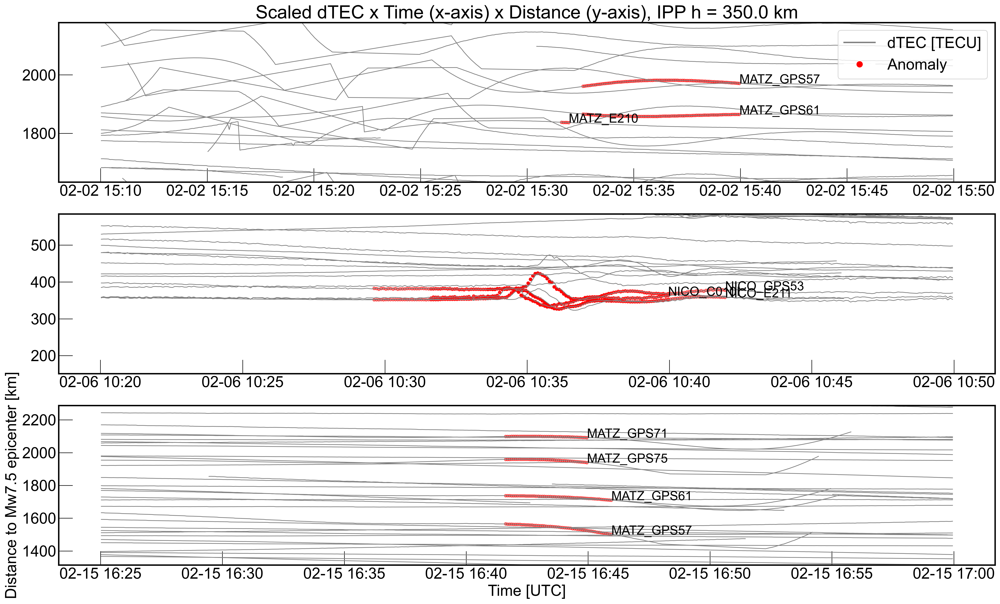

In [8]:
plt.style.use('default')
plt.rcParams.update({'axes.facecolor':'white'})
# plt.rcParams.update({'axes.edgecolor':'white'})
plt.rcParams["date.autoformatter.minute"] = "%m-%d %H:%M"
plt.rcParams['xtick.major.size']=20
plt.rcParams['xtick.direction']='in'
plt.rcParams['ytick.major.size']=20
plt.rcParams['ytick.direction']='in'
plt.rcParams["font.family"] = "Arial"
plt.rcParams['font.size'] = 22
plt.rcParams['axes.linewidth'] = 2
plt.rcParams['figure.frameon'] = True
h=350000
plots = 3

fig, ax = plt.subplots(figsize=(24,14), dpi=300, nrows=plots, ncols=1)

legend_elements = [Line2D([0], [0], color='gray', lw=2, label='dTEC [TECU]'),
#                    Line2D([0], [0], color='black', ls='-', lw=2, label='Forecast'),
                   Line2D([0], [0], marker='o', color='w', label='Anomaly',
                          markerfacecolor='red', markersize=10)]
path_of_the_directory = 'mapping_results_10min_int'
   
for i in range(0,plots):
    j = 18
    y_min = np.array([])
    y_max = np.array([]) 
    
    for filename in os.listdir(path_of_the_directory):
        f = os.path.join(path_of_the_directory,filename)
        df = pd.read_csv(f)
        df['Time'] = pd.to_datetime(df['Time'])
        df.set_index('Time', inplace=True)

        file_info = filename.split('_')
        station_name = file_info[0]
        sat_name = file_info[1]
        station_sat_name = station_name + '_'+sat_name 
        
        clip1 = df.loc[str(clip_times[i+j][0]):str(clip_times[i+j][1])].copy()
        clip1 = clip1.reset_index() 
        clip1['Time'] = pd.to_datetime(clip1['Time'])
        clip1.set_index('Time', inplace=True)
        clip1['scaled_dTEC'] = clip1['distance_to_earthquake']+(clip1['dTEC']*20)
        ax[i].plot(clip1.index, clip1['scaled_dTEC'], lw=1, color = 'gray')

        if ('anomaly' in clip1.columns):
            temp = clip1[~clip1['anomaly'].isna()].copy()
            if (len(temp['anomaly'])>0):
                temp['scaled_anomaly'] = temp['distance_to_earthquake']+(temp['anomaly']*20)
                ax[i].scatter(temp.index, temp['scaled_anomaly'], s=16, color = 'red', alpha=0.5)
                ax[i].text(temp.index[-1], temp.scaled_anomaly[-1], station_sat_name, fontsize=18)
                y_min = np.append(y_min,min(temp['distance_to_earthquake']))
                y_max = np.append(y_max, max(temp['distance_to_earthquake']))
                ax[i].set_ylim(min(y_min)-200, max(y_max)+200)
                                        
ax[plots-1].set_xlabel('Time [UTC]')
ax[2].set_ylabel('Distance to Mw7.5 epicenter [km]')
ax[0].legend(handles=legend_elements, loc='upper right')
ax[0].set_title(f'Scaled dTEC x Time (x-axis) x Distance (y-axis), IPP h = {h/1000} km')
plt.show()

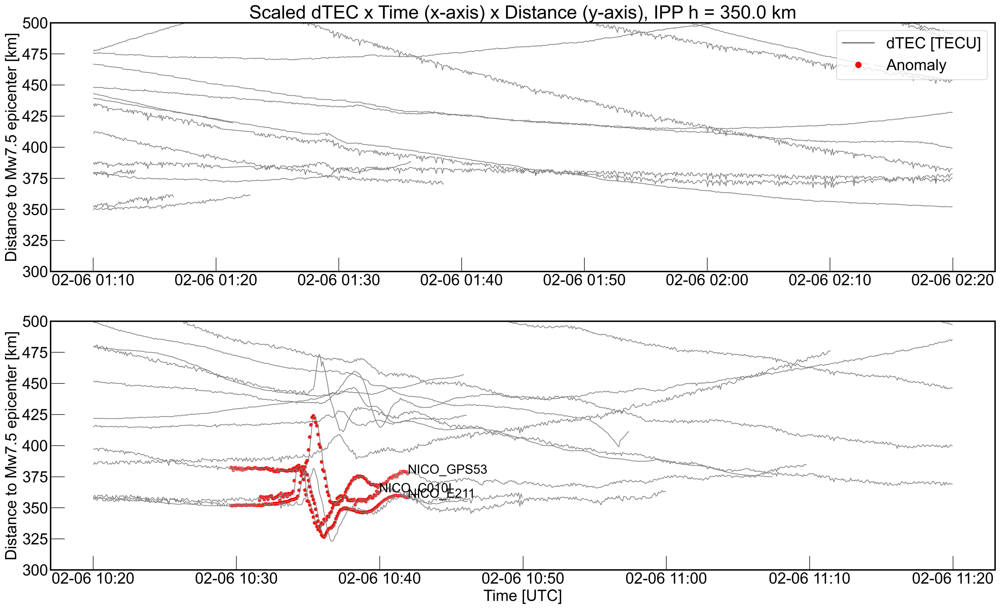

In [4]:
eq_times = np.array([["2023-02-06 01:10:00.00","2023-02-06 02:20:00.00"],
                      ["2023-02-06 10:20:00.00","2023-02-06 11:20:00.00"]])

plt.style.use('default')
plt.rcParams.update({'axes.facecolor':'white'})
# plt.rcParams.update({'axes.edgecolor':'white'})
plt.rcParams["date.autoformatter.minute"] = "%m-%d %H:%M"
plt.rcParams['xtick.major.size']=20
plt.rcParams['xtick.direction']='in'
plt.rcParams['ytick.major.size']=20
plt.rcParams['ytick.direction']='in'
plt.rcParams["font.family"] = "Arial"
plt.rcParams['font.size'] = 22
plt.rcParams['axes.linewidth'] = 2
plt.rcParams['figure.frameon'] = True
h=350000
plots = 2

fig, ax = plt.subplots(figsize=(24,14), dpi=300, nrows=plots, ncols=1)

legend_elements = [Line2D([0], [0], color='gray', lw=2, label='dTEC [TECU]'),
#                    Line2D([0], [0], color='black', ls='-', lw=2, label='Forecast'),
                   Line2D([0], [0], marker='o', color='w', label='Anomaly',
                          markerfacecolor='red', markersize=10)]
path_of_the_directory = 'mapping_results_10min_int'
   
for i in range(0,plots):
    j = 0
    y_min = np.array([])
    y_max = np.array([]) 
    
    for filename in os.listdir(path_of_the_directory):
        f = os.path.join(path_of_the_directory,filename)
        df = pd.read_csv(f)
        df['Time'] = pd.to_datetime(df['Time'])
        df.set_index('Time', inplace=True)

        file_info = filename.split('_')
        station_name = file_info[0]
        sat_name = file_info[1]
        station_sat_name = station_name + '_'+sat_name 
        
        clip1 = df.loc[str(eq_times[i+j][0]):str(eq_times[i+j][1])].copy()
        clip1 = clip1.reset_index() 
        clip1['Time'] = pd.to_datetime(clip1['Time'])
        clip1.set_index('Time', inplace=True)
        clip1['scaled_dTEC'] = clip1['distance_to_earthquake']+(clip1['dTEC']*20)
        ax[i].plot(clip1.index, clip1['scaled_dTEC'], lw=1, color = 'gray')

        if ('anomaly' in clip1.columns):
            temp = clip1[~clip1['anomaly'].isna()].copy()
            if (len(temp['anomaly'])>0):
                temp['scaled_anomaly'] = temp['distance_to_earthquake']+(temp['anomaly']*20)
                ax[i].scatter(temp.index, temp['scaled_anomaly'], s=16, color = 'red', alpha=0.5)
                ax[i].text(temp.index[-1], temp.scaled_anomaly[-1], station_sat_name, fontsize=18)
                y_min = np.append(y_min,min(temp['distance_to_earthquake']))
                y_max = np.append(y_max, max(temp['distance_to_earthquake']))
                
ax[0].set_ylim(300, 500) 
ax[1].set_ylim(300, 500) 
ax[plots-1].set_xlabel('Time [UTC]')
ax[0].set_ylabel('Distance to Mw7.5 epicenter [km]')
ax[1].set_ylabel('Distance to Mw7.5 epicenter [km]')
ax[0].legend(handles=legend_elements, loc='upper right')
ax[0].set_title(f'Scaled dTEC x Time (x-axis) x Distance (y-axis), IPP h = {h/1000} km')
plt.show()
